# Visualization
## General
### Matplotlib
matplotlib has been the default visualization Python library data scientists and machine learning engineers are using. One of the reasons is its similarity to Matlab syntax and types of commands. 

### Plotly
Plotly is the option when interactivity is a requirement. 

## Matplotlib Examples

In [1]:
# Draw y = x ^ 2 - 2 in [-1, 1] 
import matplotlib.pyplot as plt
import numpy as np
x = np.arange(-1, 1, 0.01)
y = x ** 2- 2
plt.plot(x, y)
plt.show()

<Figure size 640x480 with 1 Axes>

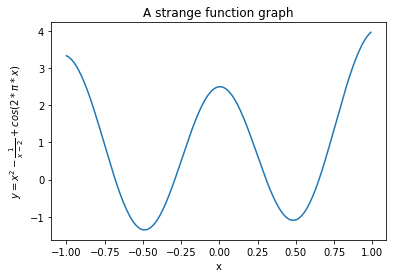

In [2]:
# 2 Draw a more complex function
import matplotlib.pyplot as plt
import numpy as np
x = np.arange(-1, 1, 0.01)
y = x ** 2 - 1 / (x - 2) + 2 * np.cos(2*np.pi*x)
plt.plot(x, y)
plt.xlabel('x')
plt.ylabel('$y=x^2 - \\frac{1}{x-2} + cos(2*\\pi*x)$')  # can write latex code in labels!
plt.title('A strange function graph')
plt.show()

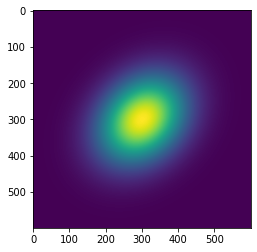

In [3]:
# 3 Draw 2D function graphs
import numpy as np
import matplotlib.cm as cm
import matplotlib.pyplot as plt
x = y = np.arange(-3.0, 3.0, 0.01)
X, Y = np.meshgrid(x, y)
Z = np.exp(-X**2 - Y**2 + 0.2 * (X - Y) ** 2)
fig, ax = plt.subplots()
im = ax.imshow(Z, interpolation='bilinear')
plt.show()

More matplotlib examples can be found [here](https://matplotlib.org/3.1.1/gallery/index.html)

## Plotly Examples
### An simple Scatter example
Let's work again on the temperature data we saw at the numpy notebook and plot the day min and day max temperatures, along with their smoothed versions (there are several ways to smooth a sequence, here we demonstrate how to use the scipy.signal function convolve() to apply an averaging moving window to smooth the sequences). What does smoothing show in that case? It shows a longer-term version of the sequence under studay, trying to remove the "high frequency noise", i.e. the year-by-year small changes in the temperature values, paying more attention to the  averages in longer periods. 

In [3]:
# This is needed to use plotly in jupyter
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode(connected=True) # Initialise offline ploytly environment


import csv
import numpy as np
import plotly
import plotly.graph_objs as go


years = []
max_t, min_t = np.array([]), np.array([])
# read the csv file of New York min and max temperatures of 9th April for the last 150 years:
with open('data_ny_temperatures.csv', newline='') as csvfile:
    reader = csv.reader(csvfile, delimiter=',', quotechar='|')
    for ir, row in enumerate(reader):
        if ir>0:
            max_t = np.append(max_t, float(row[1]))
            min_t = np.append(min_t, float(row[2]))
            years.append(int(row[0].split('-')[0]))


from scipy import signal
win = signal.hann(20)
max_t_filtered = signal.convolve(max_t, win, mode='valid') / sum(win)
min_t_filtered = signal.convolve(min_t, win, mode='valid') / sum(win)
p1 = go.Scatter(x=years, y=min_t, name='min day')
p1_s = go.Scatter(x=years[10:], y=min_t_filtered, name='min day')
p2 = go.Scatter(x=years, y=max_t, name='max day')
p2_s = go.Scatter(x=years[10:], y=max_t_filtered, name='max day')
plotly.offline.iplot([p1, p1_s, p2, p2_s])


### Another Scatter example. Histograms calculation
Let's go back in the numpy notebook. Remember when we mean/std nomralized (standardized) a random sequence? Lets visualize these values before and after normalization to get a better taste of the physical meaning of standardization. 

In addition, let's also draw the *histograms* of the respective random variables. A histogram is a discrete estimated of the probability distribution of the random variable. One of the ways to compute it is using numpy.histogram. This function returns the histogram counts and the histogram bins endpoints. So we normalize the histogram counts by their sum so that they are more like probabilities) and we calculate the center of the bins to use them in the histogram visualization


In [4]:
import numpy as np
import numpy.random
m, s, n_samples = 10, 2, 1000
x = numpy.random.normal(m, s, n_samples)
m_est = x.mean()
s_est = x.std()
# z = (x - m) / s
x_norm = (x - m_est) / s_est

# get and normalize histograms
h, bins = np.histogram(x)
h = h / h.sum()
bins_centers = (bins[0:-1] + bins[1:]) / 2  # get histogram bin center from the endpoinds returned by np.histogram()
h_norm, bins_norm = np.histogram(x_norm)
h_norm = h_norm / h_norm.sum()
bins_centers_norm = (bins_norm[0:-1] + bins_norm[1:]) / 2


# plot:
import plotly
import plotly.subplots
import plotly.graph_objs as go

marker_style1 = dict(color='red', size=2, line=dict(color='red', width=2))
marker_style2 = dict(color='green', size=2, line=dict(color='green', width=2))

fig = plotly.subplots.make_subplots(rows=1, cols=2)
p1 = go.Scatter(y=x, name='random variable', marker=marker_style1)
p2 = go.Scatter(y=x_norm, name='normalized random variable', marker=marker_style2)
fig.append_trace(p1, 1, 1)
fig.append_trace(p2, 1, 1)
hp1 = go.Scatter(x=bins_centers, y=h, name='random variable histogram', marker=marker_style1)
hp2 = go.Scatter(x=bins_centers_norm, y=h_norm, name='normalized random variable histogram', marker=marker_style2)
fig.append_trace(hp1, 1, 2)
fig.append_trace(hp2, 1, 2)
plotly.offline.iplot(fig)

### Image example with face bounding boxes

Found 11 Faces!



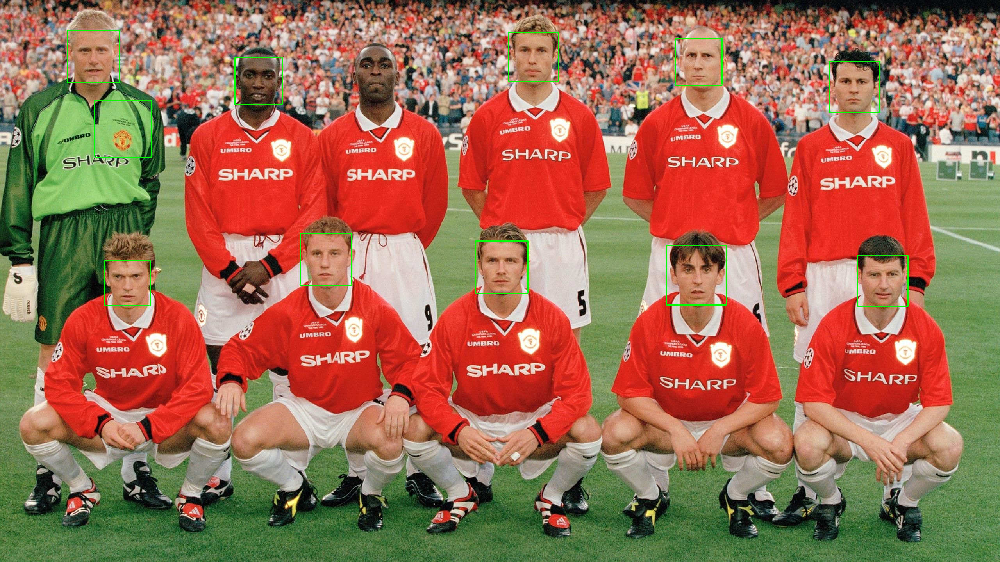

In [5]:
import cv2
image = cv2.imread('image.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

faceCascade = cv2.CascadeClassifier("haarcascade_frontalface_default.xml")
faces = faceCascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=3, minSize=(105, 105))

print(f"Found {len(faces)} Faces!")

for (x, y, w, h) in faces:
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

# plotly now supports imshow:
import plotly.express as px
fig = px.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
fig.update_xaxes(showticklabels=False)
fig.update_yaxes(showticklabels=False)
plotly.offline.iplot(fig)

### Confusion matrix visualization example

In [6]:
import plotly
import plotly.subplots
import plotly.graph_objs as go
cm = [[90, 10, 0], [5, 70, 25], [5, 20, 75]]
class_names = ['jazz', 'rnb', 'techno']
heatmap = go.Heatmap(z=np.flip(cm, axis=0), x=class_names,
                     y=list(reversed(class_names)),
                     colorscale=[[0, '#4422ff'], [1, '#ff4422']],
                     name="confusin matrix", showscale=False)
mark_prop1 = dict(color='rgba(150, 180, 80, 0.5)',
                  line=dict(color='rgba(150, 180, 80, 1)', width=2))
mark_prop2 = dict(color='rgba(140, 200, 120, 0.5)',
                  line=dict(color='rgba(140, 200, 120, 1)', width=2))
mark_prop3 = dict(color='rgba(50, 150, 220, 0.5)',
                  line=dict(color='rgba(50, 150, 220, 1)', width=3))
plotly.offline.iplot([heatmap])

## Flask, dash etc

[Flask](https://flask.palletsprojects.com/en/1.1.x/) 
Flask is a framework for building web applications. It provides you with tools, libraries and technologies that allow you to build a web application.

[Dash](https://dash.plotly.com) is another  Python framework for building web applications. It uses Flask, Plotly, and React and is ideal for building data visualization apps. It's particularly suited for anyone who works with data in Python. TODO Demo example



